# Multi-class Dog Breed Classification
Multiclass Dog Breed classification model build with TensorFlow and TensorFlow Hub

## 1. Problem
Given an image of a dog, asked to identify its breed.

## 2. Data
Data used is taken from Stanford University Dogs Dataset http://vision.stanford.edu/aditya86/ImageNetDogs/

## 3. Evaluation
The resultant model will be evaluated based on the Multi-class Log Loss.

## 4. Features
- Unstructured data (images)
- 120 Categories (dog breeds)
- Total of 20579 unique images.
- Approximately 150 images per breed.

## Note: 
- The data has been downloaded and extracted beforehand, hence why the procedure is not shown in the notebook. 
- ^^ Personally retrieved the data with `!wget` and then extracted it with the `tarfile` library.
- It can be noted that one of the image in the dataset may be corrupted during extraction (as seen from the use of 20579 instead of 20580), 
so errors when processing/fitting the whole data might be occur.
- A simple solution that was done was the use a `Binary Search` strategy to find the corrupted image and remove it from the data.

# First, We Need to Prepare Libraries

In [1]:
!git clone https://github.com/edbertekaputera/dog_breed_classifier

Cloning into 'dog_breed_classifier'...
remote: Enumerating objects: 41162, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 41162 (delta 5), reused 16 (delta 4), pack-reused 41145
Receiving objects: 100% (41162/41162), 1.47 GiB | 34.41 MiB/s, done.
Resolving deltas: 100% (13/13), done.
Checking out files: 100% (20601/20601), done.


In [2]:
#Import libraries
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Image
import os
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

#Check whether theres GPU available
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.8.2
TF Hub version: 0.12.0
GPU available


# Second, We need to prepare the datasets
## First we get the filenames and labels

In [3]:
labels = []
filenames = []

for folders in os.listdir("Images/train_images"):
    breed = "".join(folders.split("-")[1:])
    for fname in os.listdir(f"Images/train_images/{folders}"):
        if fname[-3:] == "jpg":
            labels.append(breed)
            filenames.append(f"Images/train_images/{folders}/{fname}")
        else:
            print(fname)

# convert to np array for convinience
labels = np.array(labels)
filenames = np.array(filenames)
len(labels), len(filenames), labels[0], filenames[0]

(20580,
 20580,
 'beagle',
 'Images/train_images/n02088364-beagle/n02088364_12440.jpg')

## Then we get the unique labels

In [4]:
unique_breeds = np.unique(labels)
len(unique_breeds), unique_breeds[:10]

(120, array(['Afghan_hound', 'African_hunting_dog', 'Airedale',
        'American_Staffordshire_terrier', 'Appenzeller',
        'Australian_terrier', 'Bedlington_terrier', 'Bernese_mountain_dog',
        'Blenheim_spaniel', 'Border_collie'], dtype='<U30'))

## Finally we convert the labels into an array of boolean values 0 and 1

In [5]:
boolean_labels = np.array([label == unique_breeds for label in labels])
boolean_labels.shape

(20580, 120)

In [ ]:
print(labels[0]) # label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occur in boolean array
print(boolean_labels[0].astype(int)) #convert bool to int

Chesapeake_Bay_retriever
(array([16]),)
16
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## With that our x and y data are ready

In [6]:
x = filenames
y = boolean_labels
x[:5], y[:5]

(array(['Images/train_images/n02088364-beagle/n02088364_12440.jpg',
        'Images/train_images/n02088364-beagle/n02088364_4281.jpg',
        'Images/train_images/n02088364-beagle/n02088364_959.jpg',
        'Images/train_images/n02088364-beagle/n02088364_12124.jpg',
        'Images/train_images/n02088364-beagle/n02088364_13484.jpg'],
       dtype='<U80'),
 array([[False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,  True, False, False,

## Next step is to prepare our image data into a format which can be processed and trained by TensorFlow aka tensors

In [7]:
#Define image size
IMG_SIZE = 224

#Function for preprocessing
def process_image(filename, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns it into a tensor.
  """
  #read image
  image = tf.io.read_file(filename)

  #turn jpeg to numerical Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert colour channels values 0-255 to 0-1 values.
  #This is a normalization process to make process more efficient.
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize to (224,224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

#Create a function to return a tuple of (image, label)
def get_image_tuple(filename, label):
  """
  Takes an image file path and label
  then processes and return a tuple (image, label)
  """
  image = process_image(filename)
  return image, label

In [ ]:
process_image(x[0]).shape # Creates a tensor with shape 224,224, 3 for the 3 layers of color RGB

TensorShape([224, 224, 3])

## Function to convert image into processed tensors batch datasets 

In [8]:
BATCH_SIZE = 32

#function to turn data to batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of (image x) and (label y) pairs.
  Shuffles the data if its training data, but not when validation data.
  Also accepts test data as input (no labels).
  """
  #If test dataset, we probably don't have labels
  if test_data:
    print(f"Creating test data batches... BATCH SIZE={batch_size}")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch = data.map(process_image).batch(batch_size)

  #If validation dataset, we don't need to shuffle
  elif valid_data:
    print(f"Creating validation data batches... BATCH SIZE={batch_size}")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepath
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_tuple).batch(batch_size)
  
  else:
    print(f"Creating training data batches... BATCH SIZE={batch_size}")
    #turn filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepath
                                              tf.constant(y))) # labels
    #shuffle
    data = data.shuffle(buffer_size=len(x))

    #process into (image,label) tuple and make batch
    data = data.map(get_image_tuple)
    data_batch = data.batch(batch_size)
  return data_batch

# Building a Model !

Before we build a model, there are a few things we need to define:
* The input shape (image shape in the form of Tensors)
* The output shape (image labels in the form of Tensors)
* URL of model we want to use Transfer Learning with from TensorFlow Hub
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

^^ MobileNet Image Classification (Size = 224x224, Depth Multiplier = 1.3)

In [9]:
#setup input shape into the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channel

#setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#setup model URL from Tensorflow HUB
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our Inputs, Outputs, and Model ready...
Lets put them together into a Keras Deep Learning Model!

Knowing this, let's create a function that:
* takes input shape, output shape, and model as parameters
* Defines the layers of KEras Model in a sequential fashion
* Compiles the model (Says it should be evaluated and improved)
* Builds model (Tell model the input shape it'll be getting)
* Return the model

All the steps can be found in https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a Function which builds a Keras Model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print(f"Building model with {MODEL_URL}")

  # Setup Model Layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (Input Layer)
    tf.keras.layers.Dense(units=output_shape, 
                          activation="softmax") # Layer 2 (Output Layer)       
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics =["accuracy"]
  )

  # Build Model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to:
* Save its progress
* Check its progress
* Stop Training early if it stops improving

We'll create 2 callbacks,
- One is for TensorBoard, helps track our model progress
- Second is for early stopping, prevents model from training too long (becoming overfitted)


### TensorBoard Callback
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

To setup the Tensorboard Callback, we need to:
1. Load a TensorBoard notebook Extension
2. Create a Tensorboard Callback which save logs to a directory and pass it to the model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training)

In [65]:
# Load TensorBoard Notebook Extension
%load_ext tensorboard

import datetime

# Create TensorBoard Callback Function
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("Logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S") # Tracks time everytime we run experiment
                        )
  return tf.keras.callbacks.TensorBoard(logdir)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Early Stopping Callback
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

Helps model from overfitting by stopping training if a certain evaluation metric stops improving

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

Let's create a function which trains a model.

* Create a model using `create_model`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, num of epochs to train for (`NUM_EPOCHS`), and callbacks
* Return Model

In [ ]:
NUM_EPOCHS = 100

def train_model(train_data, valid=False, val_data=None):
    """
    Trains a given model and returns the trained version.
    """

    # Create model
    model = create_model()

    # Create new TensorBoard session everytime we train the model
    tensorboard = create_tensorboard_callback()

    # Fit the model
    if valid:
        # Create early stopping callback
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                      patience=3)
        model.fit(x=train_data,
                epochs=NUM_EPOCHS,
                validation_data=val_data,
                validation_freq=1,
                callbacks=[tensorboard, early_stopping]
                )
    else:
        # Create early stopping callback
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                  patience=3)
        model.fit(x=train_data,
                epochs=NUM_EPOCHS,
                callbacks=[tensorboard, early_stopping]
                )
  
    # Return the fitted model
    return model

# With all prepared, it is time to train the model with the 
## To start off, lets try training 1000 data first

In [ ]:
from sklearn.model_selection import train_test_split

NUM_IMAGES = 1000

#Split to train and validation
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES], 
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

# Create dataset batches
train_batch = create_data_batches(x_train, y_train)
val_batch = create_data_batches(x_val, y_val, valid_data=True)

# Fit the model to data
model = train_model(train_batch, valid=True, val_data=val_batch)

Creating training data batches... BATCH SIZE=32


KeyboardInterrupt: ignored

### Checking the TensorBoard Logs

the Tensor board function `%tensorboard` will access the logs we created and visualize its content

In [ ]:
%tensorboard --logdir Logs

UsageError: Line magic function `%tensorboard` not found.


## Make a prediction using the trained model and evaluate VISUALLY

In [ ]:
# Make Predictions on validation data (not trained on)

preds = model.predict(val_batch, verbose=1)
preds

NameError: name 'model' is not defined

In [11]:
# Lets make a function that convert the array of numbers into a label prediction...
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# get_pred_label(pred[0])

In [ ]:
# Function to unbatch datasets
def unbatchify(data):
  """
  Takes batched dataset of (image, labels) Tensors and 
  returns separate arrays of images and labels.
  """

  images_ = []
  labels_ = []
  # Loop through unbatched data and unbatch em
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(get_pred_label(label))

  return images_, labels_

# unbatched_image, unbatched_label = unbatchify()
# unbatched_image[0], unbatched_label[0]

In [ ]:
# Personal function to check accuracy of prediction
def preds_check(index=0,preds=preds, verbose=False):
  if verbose:
    print(preds[index])
  print(f"Max value (probability of prediction) : {np.max(preds[index])}")
  print(f"Sum : {np.sum(preds[index])}")
  print(f"Max Index: {np.argmax(preds[index])}")
  print(f"Predicted label: {get_pred_label(preds[index])}")
  print(f"Actual label: {unbatched_label[index]}")

NameError: ignored

In [ ]:
preds_check(0)

Max value (probability of prediction) : 0.9974796175956726
Sum : 0.9999999403953552
Max Index: 3
Predicted label: basset
Actual label: basset


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change color if right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  # Change plot title to predicted, prob predicted, truth label
  plt.title("{} / {:2.2f}% / {}".format(pred_label, 
                                        np.max(pred_prob)*100,
                                        true_label),
            color=color)

    
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], get_pred_label(labels[n])

  # Get predicted label
  pred_label = get_pred_label(pred_prob)

  # Find top 10 prediction confidence indexes
  top_10_pred_index = pred_prob.argsort()[-10:][::-1]
  # Find top 10 prediction confidence values
  top_10_pred_value = pred_prob[top_10_pred_index]
  # Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_index]

  # Plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_value,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color
  if np.isin(true_label, top_10_pred_labels).any():
    print("Truth Label = ", true_label)
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

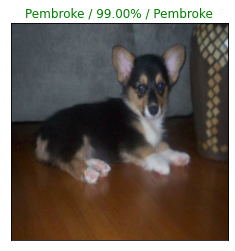

In [ ]:
plot_pred(preds,unbatched_label,unbatched_image, 4)

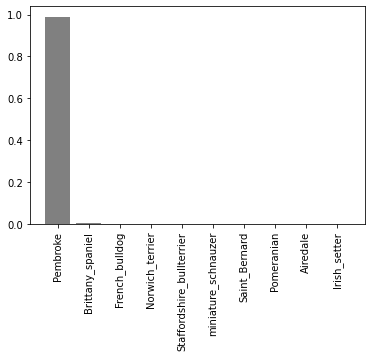

In [ ]:
plot_pred_conf(preds, unbatched_label, 4)

## Saving and reloading a trained model

In [73]:
# Create a function to save model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string)
  """

  # Create model directory pathname. with current time
  modeldir = os.path.join("Models",
                          datetime.datetime.now().strftime("%Y_%m_%d-%H_%M_%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

# Create a function to load model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer" : hub.KerasLayer})
  return model


In [ ]:
# Save a model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /Models/2022:06:25-08:131656144811-1000-images-mobilenetv2-Adam.h5...


'/Models/2022:06:25-08:131656144811-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a model trained on 1000 images
loaded_1000_image_model = load_model("Models/2022:06:25-08:071656144422-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: Models/2022:06:25-08:071656144422-1000-images-mobilenetv2-Adam.h5


In [ ]:
loaded_1000_image_model.evaluate(val_batch)

7/7 [==============================] - 1s 79ms/step - loss: 0.0933 - accuracy: 0.9600


[0.09333185106515884, 0.9599999785423279]

## NOW, lets train the mode with the full data

In [13]:
from sklearn.model_selection import train_test_split

#Split to train and validation
x_train, x_val, y_train, y_val = train_test_split(x, 
                                                  y,
                                                  test_size=0.2,
                                                  random_state=42)
print(len(x_train), len(y_train), len(x_val), len(y_val))

train_batch = create_data_batches(x_train, y_train)
val_batch = create_data_batches(x_val, y_val, valid_data=True)
train_batch, val_batch

16464 16464 4116 4116
Creating training data batches... BATCH SIZE=32
Creating validation data batches... BATCH SIZE=32


(<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>,
 <BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>)

In [ ]:
# Create full model
full_model = create_model()
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3) # Stops when accuracy does not improve for 3 epochs

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Fit the model to full data
full_model.fit(x=train_batch,
                epochs=100,
                validation_data=val_batch,
                validation_freq=1,
                callbacks=[full_model_tensorboard, full_model_early_stopping]
                )

Epoch 1/100
515/515 [==============================] - 81s 131ms/step - loss: 1.0756 - accuracy: 0.7216 - val_loss: 0.6264 - val_accuracy: 0.8052
Epoch 2/100
515/515 [==============================] - 56s 109ms/step - loss: 0.3868 - accuracy: 0.8784 - val_loss: 0.6182 - val_accuracy: 0.8156
Epoch 3/100
515/515 [==============================] - 58s 113ms/step - loss: 0.2469 - accuracy: 0.9247 - val_loss: 0.6327 - val_accuracy: 0.8156
Epoch 4/100
515/515 [==============================] - 65s 126ms/step - loss: 0.1713 - accuracy: 0.9529 - val_loss: 0.6416 - val_accuracy: 0.8209
Epoch 5/100
515/515 [==============================] - 60s 117ms/step - loss: 0.1270 - accuracy: 0.9683 - val_loss: 0.6797 - val_accuracy: 0.8144
Epoch 6/100
515/515 [==============================] - 60s 117ms/step - loss: 0.0977 - accuracy: 0.9753 - val_loss: 0.7045 - val_accuracy: 0.8171
Epoch 7/100
515/515 [==============================] - 69s 134ms/step - loss: 0.0749 - accuracy: 0.9831 - val_loss: 0.7143 -

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: Models/2022:06:29-07:471656488859-full-image-set-mobilenetv2-Adam.h5...


'Models/2022:06:29-07:471656488859-full-image-set-mobilenetv2-Adam.h5'

## Testing the loaded full model on some custom images

In [45]:
loaded_full_model = load_model("Models/2022:06:29-07:471656488859-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: Models/2022:06:29-07:471656488859-full-image-set-mobilenetv2-Adam.h5


OSError: ignored

In [15]:
custom_images = [ "Images/custom-images/" + fname for fname in os.listdir("Images/custom-images")]
custom_images

['Images/custom-images/S__18554887.jpg',
 'Images/custom-images/pompom.jpeg',
 'Images/custom-images/WhatsApp Image 2022-06-16 at 8.28.28 PM.jpeg',
 'Images/custom-images/image.jpeg',
 'Images/custom-images/S__18554885.jpg',
 'Images/custom-images/S__15302660.jpg',
 'Images/custom-images/WhatsApp Image 2022-06-16 at 9.22.39 PM.jpeg',
 'Images/custom-images/Shiba-Inu-standing-in-profile-outdoors.jpeg',
 'Images/custom-images/WhatsApp Image 2022-06-27 at 8.35.08 PM.jpeg']

In [ ]:
custom_batch = create_data_batches(custom_images, test_data=True)
custom_batch

Creating test data batches... BATCH SIZE=32


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_predictions = loaded_full_model.predict(custom_batch)
custom_predictions

array([[2.20427870e-10, 4.60760562e-11, 3.33725430e-12, ...,
        1.44588244e-10, 2.09139220e-10, 6.06873319e-12],
       [2.52349892e-08, 1.19192034e-09, 2.69446083e-08, ...,
        2.36130950e-06, 1.04621463e-07, 4.66960455e-06],
       [8.49728465e-09, 6.68732980e-08, 7.99669102e-02, ...,
        4.88110481e-06, 5.45009698e-06, 1.34108313e-06],
       ...,
       [8.97528185e-09, 2.12643861e-10, 6.40306007e-06, ...,
        4.16043164e-08, 1.23443044e-07, 5.35390221e-08],
       [1.42327679e-07, 2.69556807e-07, 5.06569853e-09, ...,
        8.57445315e-08, 4.85489444e-08, 1.60941374e-06],
       [6.44446163e-10, 2.35588243e-10, 1.01331755e-11, ...,
        7.28225569e-09, 5.29734978e-10, 1.68295884e-08]], dtype=float32)

## Let's make a function to do 

In [14]:
# COMPLETE DOG BREED PREDICTION FUNCTION
def dog_breed_predict(filename_list: list, model):
  # Turn images into batch datasets
  file_batch = create_data_batches(filename_list, test_data=True)
  # Make predictions on the data
  prediction = model.predict(file_batch)
  # Get custom image prediction labels
  custom_pred_labels = [get_pred_label(i) for i in prediction]
  # Unbatch batched datasets
  custom_images = []
  for image in file_batch.unbatch().as_numpy_iterator():
    custom_images.append(image)
  # Plot results
  no_rows = len(filename_list)//3 + (0 if (len(filename_list)%3 == 0) else 1)
  no_cols = 3
  if len(filename_list) < 3:
    no_cols = len(filename_list) * 3

  plt.figure(figsize=(3*no_cols,3*no_rows))
  for i, image in enumerate(custom_images):
    # Confidence percentage
    confidence_perc = np.max(prediction[i])*100

    # Coloring based on confidence
    if confidence_perc >= 85:
        color = "green"
    elif confidence_perc >= 70:
        color = "blue"
    elif confidence_perc >= 50:
        color = "orange"
    else:
        color = "red"
       
    plt.subplot(no_rows,3,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title("{} / {:2.2f}%".format(custom_pred_labels[i], confidence_perc), color=color)
    plt.imshow(image)

Creating test data batches... BATCH SIZE=32


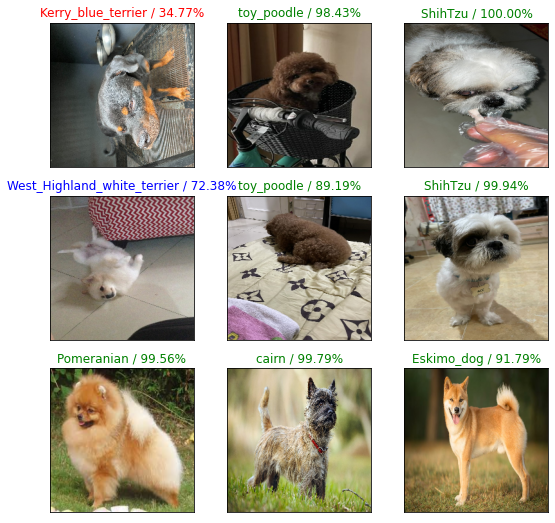

In [ ]:
dog_breed_predict(custom_images, loaded_full_model)

In [ ]:
idx = custom_predictions[1].argsort()[-10:][::-1]
for i in idx:
  print((unique_breeds[i] , f"{custom_predictions[1][i]*100} %"))

('West_Highland_white_terrier', '80.31294345855713 %')
('Maltese_dog', '6.527858227491379 %')
('Blenheim_spaniel', '2.2890059277415276 %')
('toy_poodle', '2.2722238674759865 %')
('Pomeranian', '2.1784119307994843 %')
('cocker_spaniel', '1.4457790181040764 %')
('Samoyed', '1.4028540812432766 %')
('Labrador_retriever', '1.1827414855360985 %')
('ShihTzu', '0.7510845549404621 %')
('Pekinese', '0.5069939885288477 %')


# Data Augmentation for further improvement on model (Enrichment of training data)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


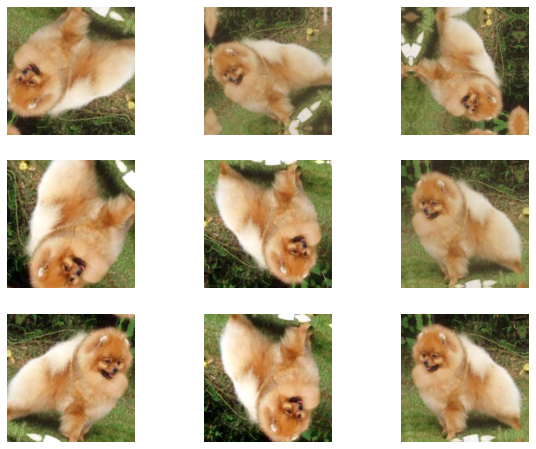

In [16]:
def augment_image(image, seed):
  data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical",seed=seed),
    tf.keras.layers.RandomRotation(0.2,seed=seed),
    tf.keras.layers.RandomZoom(0.2,seed=seed),
    tf.keras.layers.RandomCrop(height=IMG_SIZE, width=IMG_SIZE,seed=seed),
    tf.keras.layers.RandomContrast(0.25,seed=seed)
  ])
  return data_augmentation(image)
  
# Show example of augmentations
image = process_image(custom_images[1])
image = tf.cast(tf.expand_dims(image, 0), tf.float32)

plt.figure(figsize=(10, 8))
for i in range(9):
  augmented_image = augment_image(image, i)
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(augmented_image[0])
  plt.axis("off")

In [17]:
# Lets create a function that augments the data when creating a tuple (image, label)
def get_augmented_image_tuple(filename, label, seed=0):
  """
  Takes an image file path and label
  then processes & augments and return a tuple (image, label)
  """
  image = process_image(filename)
  return augment_image(image, seed), label

In [18]:
# Lets update the batching function
BATCH_SIZE = 32

#function to turn data to batches
def create_data_batches(x, y=None, batch_size=32, valid_data=False, test_data=False, augment=False, seed=0):
  """
  Create batches of data out of (image x) and (label y) pairs.
  Shuffles the data if its training data, but not when validation data.
  Also accepts test data as input (no labels).
  """
  #If test dataset, we probably don't have labels
  if test_data:
    print(f"Creating test data batches... BATCH SIZE={batch_size}")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch = data.map(process_image).batch(batch_size)

  #If validation dataset, we don't need to shuffle
  elif valid_data:
    print(f"Creating validation data batches... BATCH SIZE={batch_size}")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepath
                                              tf.constant(y))) # labels
    if augment:
      print(f"Augmenting seed = {seed}")
      data = data.map(lambda data, seed : get_augmented_image_tuple(data, seed))
    else:
      data = data.map(get_image_tuple)
    data_batch = data.batch(batch_size)
  
  else:
    print(f"Creating training data batches... BATCH SIZE={batch_size}")
    #turn filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepath
                                              tf.constant(y))) # labels
    #shuffle
    data = data.shuffle(buffer_size=len(x))

    #process into (image,label) tuple and make batch
    if augment:
      print(f"Augmenting seed = {seed}")
      data = data.map(lambda data, seed : get_augmented_image_tuple(data, seed))
    else:
      data = data.map(get_image_tuple)
    data_batch = data.batch(batch_size)
  return data_batch

In [19]:
#Create function for viewing images in data batches

def show_32_images(images, labels):
  """
  Display a plot of 25 images and their labels from data batch
  """
  plt.figure(figsize=(10,16))
  for i in range(32):
    #create subplots 4x8
    ax = plt.subplot(8,4, i+1)
    #Display Image
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    #remove axis
    plt.axis("off")

## First Iteration of Data Augmentation Training
Augment seed #0

In [43]:
train_augment_batch = create_data_batches(x_train, y_train, augment=True, seed=0)
val_augment_batch = create_data_batches(x_val, y_val, valid_data=True, augment=True, seed=0)
train_augment_batch, val_augment_batch

Creating training data batches... BATCH SIZE=32
Augmenting seed = 0
Creating validation data batches... BATCH SIZE=32
Augmenting seed = 0


(<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>,
 <BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>)

In [ ]:
train_images, train_labels = next(train_augment_batch.as_numpy_iterator()) #This function unbatches it into a numpy array
len(train_images), len(train_labels) #shows shape 32,32 since its batch size is 32...

(32, 32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

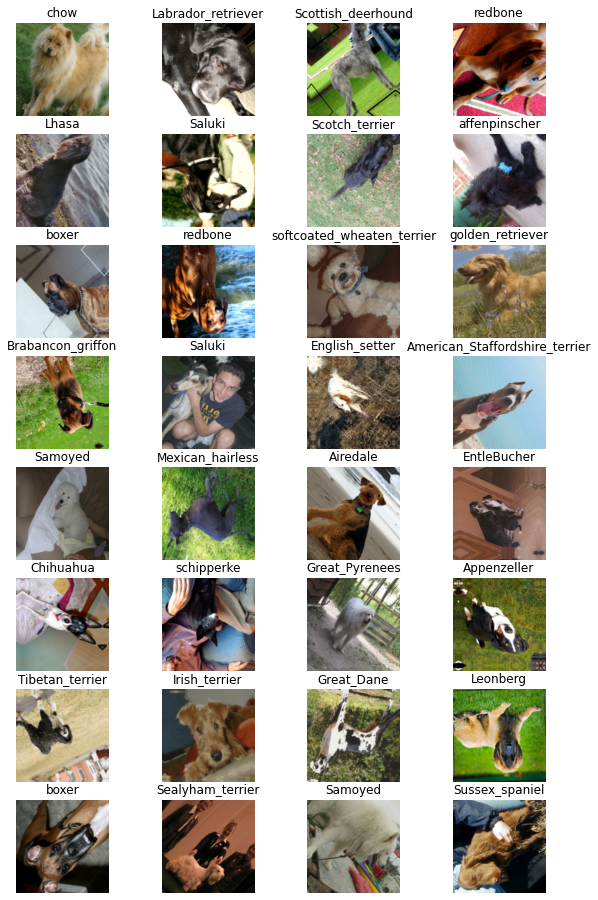

In [ ]:
show_32_images(train_images, train_labels)

### Now that we've augmented the dataset batches, let us incremently fit it into the previously trained model

In [ ]:
# Create full model callbacks
full_augment_model_tensorboard = create_tensorboard_callback()
full_augment_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3) # Stops when accuracy does not improve for 3 epochs

In [ ]:
# Fit the model to full data
loaded_full_model.fit(x=train_augment_batch,
                epochs=100,
                validation_data=val_augment_batch,
                validation_freq=1,
                callbacks=[full_augment_model_tensorboard, full_augment_model_early_stopping]
                )

Epoch 1/100
515/515 [==============================] - 324s 624ms/step - loss: 2.9398 - accuracy: 0.4868 - val_loss: 2.7119 - val_accuracy: 0.4879
Epoch 2/100
515/515 [==============================] - 310s 602ms/step - loss: 2.0454 - accuracy: 0.5598 - val_loss: 2.4625 - val_accuracy: 0.5061
Epoch 3/100
515/515 [==============================] - 305s 592ms/step - loss: 1.8307 - accuracy: 0.5839 - val_loss: 2.3887 - val_accuracy: 0.5172
Epoch 4/100
515/515 [==============================] - 319s 619ms/step - loss: 1.6495 - accuracy: 0.6061 - val_loss: 2.3412 - val_accuracy: 0.5063
Epoch 5/100
515/515 [==============================] - 318s 618ms/step - loss: 1.5715 - accuracy: 0.6168 - val_loss: 2.2861 - val_accuracy: 0.5228
Epoch 6/100
515/515 [==============================] - 282s 549ms/step - loss: 1.4806 - accuracy: 0.6263 - val_loss: 2.2655 - val_accuracy: 0.5241
Epoch 7/100
515/515 [==============================] - 302s 586ms/step - loss: 1.4682 - accuracy: 0.6228 - val_loss: 2

In [ ]:
save_model(loaded_full_model, suffix="full-augment0-image-set-mobilenetv2-Adam")

Saving model to: Models/2022:06:29-08:541656492878-full-augment0-image-set-mobilenetv2-Adam.h5...


'Models/2022:06:29-08:541656492878-full-augment0-image-set-mobilenetv2-Adam.h5'

In [ ]:
load_augment_model = load_model("Models/2022:06:29-08:541656492878-full-augment0-image-set-mobilenetv2-Adam.h5")

Loading saved model from: Models/2022:06:29-08:541656492878-full-augment0-image-set-mobilenetv2-Adam.h5


Creating test data batches... BATCH SIZE=32


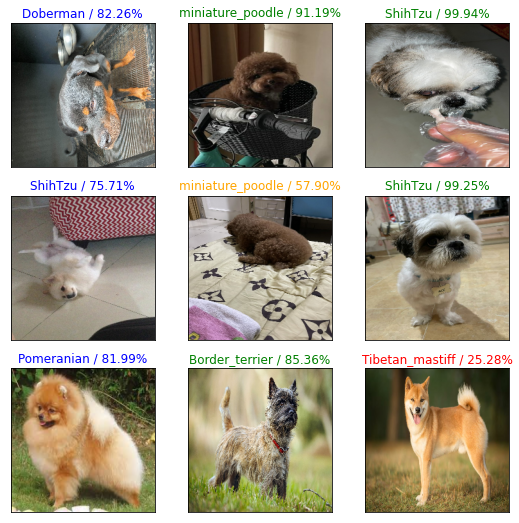

In [ ]:
dog_breed_predict(custom_images, load_augment_model)

In [ ]:
load_augment_model.evaluate(val_batch)

129/129 [==============================] - 13s 101ms/step - loss: 0.7460 - accuracy: 0.7845


[0.7459784746170044, 0.7844995260238647]

In [46]:
load_augment_model.evaluate(val_augment_batch)

129/129 [==============================] - 56s 428ms/step - loss: 1.4123 - accuracy: 0.6465


[1.4122531414031982, 0.6465014815330505]

In [ ]:
loaded_full_model.evaluate(val_batch)

129/129 [==============================] - 10s 72ms/step - loss: 0.7143 - accuracy: 0.8209


[0.7143095135688782, 0.8209426403045654]

In [ ]:
loaded_full_model.evaluate(val_augment_batch)

129/129 [==============================] - 57s 439ms/step - loss: 4.1703 - accuracy: 0.3919


[4.170333385467529, 0.39188534021377563]

### Evaluation after 1st iteration of augmented data fitting
As seen above, the accuracy of the `load_augment_model` has a slightly worse accuracy than the `loaded_full_model` when evaluating the normal validation data batches. BUT it performs **WAY BETTER** than the latter when evaluating the augmented validation data batches.

> This shows improvement in terms of the `model's overall scope` because it is generally performing better for all types of images (both normal and augmented)

**Note:**
 Realistically, people do not always has perfect images of dogs, so our model needs to be able to predict images that may be slightly augmented (translated, rotated, brightness, contrast, cropped, etc)

## Second Iteration of Data Augmentation Training
Augment seed #1

In [30]:
# THEN WE AUGMENT IT AGAIN...
train_augment1_batch = create_data_batches(x_train, y_train, augment=True, seed=1)
val_augment1_batch = create_data_batches(x_val, y_val, valid_data=True, augment=True, seed=1)
train_augment1_batch, val_augment1_batch

Creating training data batches... BATCH SIZE=32
Augmenting seed = 1
Creating validation data batches... BATCH SIZE=32
Augmenting seed = 1


(<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>,
 <BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>)

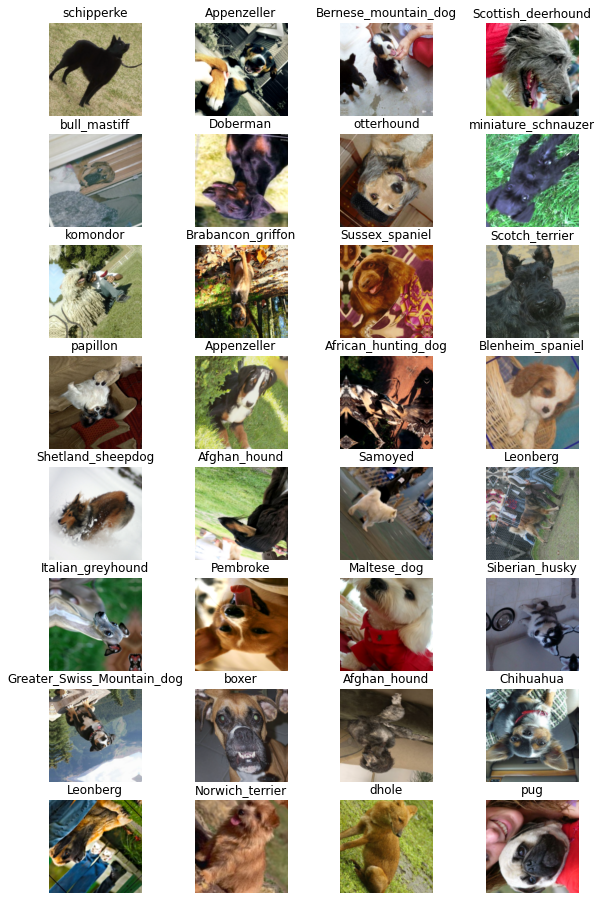

In [31]:
train_images, train_labels = next(train_augment1_batch.as_numpy_iterator()) #This function unbatches it into a numpy array
show_32_images(train_images, train_labels)

### Now that we've got our 2nd augmented data, lets fit it again

In [41]:
load_augment_model = load_model("Models/2022_06_29-08_541656492878-full-augment0-image-set-mobilenetv2-Adam.h5")

Loading saved model from: Models/2022_06_29-08_541656492878-full-augment0-image-set-mobilenetv2-Adam.h5


In [28]:
# Create full model callbacks
full_augment1_model_tensorboard = create_tensorboard_callback()
full_augment1_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3) # Stops when accuracy does not improve for 3 epochs

In [32]:
# Fit the model to full data
load_augment_model.fit(x=train_augment1_batch,
                epochs=100,
                validation_data=val_augment1_batch,
                validation_freq=1,
                callbacks=[full_augment1_model_tensorboard, full_augment1_model_early_stopping]
                )

Epoch 1/100
515/515 [==============================] - 322s 623ms/step - loss: 1.5154 - accuracy: 0.6266 - val_loss: 1.6127 - val_accuracy: 0.6093
Epoch 2/100
515/515 [==============================] - 325s 631ms/step - loss: 1.4692 - accuracy: 0.6263 - val_loss: 1.6065 - val_accuracy: 0.6045
Epoch 3/100
515/515 [==============================] - 312s 606ms/step - loss: 1.4248 - accuracy: 0.6334 - val_loss: 1.7147 - val_accuracy: 0.5892
Epoch 4/100
515/515 [==============================] - 331s 643ms/step - loss: 1.3926 - accuracy: 0.6327 - val_loss: 1.7395 - val_accuracy: 0.5950


In [35]:
saved_path = save_model(load_augment_model, suffix="full-augment1-image-set-mobilenetv2-Adam")

Saving model to: Models/2022:06:30-05:151656566150-full-augment1-image-set-mobilenetv2-Adam.h5...


In [ ]:
from google.colab import files
files.download(saved_path)

In [37]:
augment1_model = load_model("Models/2022:06:30-05:151656566150-full-augment1-image-set-mobilenetv2-Adam.h5")

Loading saved model from: Models/2022:06:30-05:151656566150-full-augment1-image-set-mobilenetv2-Adam.h5


Creating test data batches... BATCH SIZE=32


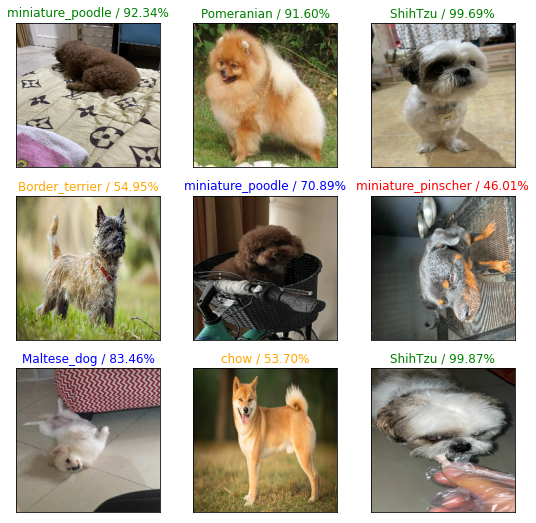

In [38]:
dog_breed_predict(custom_images, augment1_model)

In [39]:
def evaluate_model(model_before, model_after, normal_batch, augment_batch):
  """
  Evaluates model and compare it with the previous model
  """
  print("NORMAL BATCH EVALUATION")
  print("Previous Model:")
  model_before.evaluate(normal_batch)
  print("New Model:")
  model_after.evaluate(normal_batch)
  print("\nAUGMENTED BATCH EVALUATION")
  print("Previous Model:")
  model_before.evaluate(augment_batch)
  print("New Model:")
  model_after.evaluate(augment_batch)

In [42]:
evaluate_model(load_augment_model, augment1_model, val_batch, val_augment1_batch)

NORMAL BATCH EVALUATION
Previous Model:
129/129 [==============================] - 19s 141ms/step - loss: 0.3690 - accuracy: 0.8800
New Model:
129/129 [==============================] - 26s 72ms/step - loss: 0.5303 - accuracy: 0.8414

AUGMENTED BATCH EVALUATION
Previous Model:
129/129 [==============================] - 56s 431ms/step - loss: 1.4103 - accuracy: 0.6399
New Model:
129/129 [==============================] - 65s 497ms/step - loss: 1.7434 - accuracy: 0.5848


### Evaluation after 2nd iteration of augmented data fitting
As seen above, the model's accuracy on normal batch is yet again decreasing, but this time it shows worse accuracy on the augmented batch.
For the reason stated, we will be continuing with the previous model

## Third Iteration of Data Augmentation Training
Augment seed #2

In [47]:
train_augment2_batch = create_data_batches(x_train, y_train, augment=True, seed=2)
val_augment2_batch = create_data_batches(x_val, y_val, valid_data=True, augment=True, seed=2)
train_augment2_batch, val_augment_batch

Creating training data batches... BATCH SIZE=32
Augmenting seed = 2
Creating validation data batches... BATCH SIZE=32
Augmenting seed = 2


(<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>,
 <BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>)

In [48]:
train_images, train_labels = next(train_augment2_batch.as_numpy_iterator()) #This function unbatches it into a numpy array
len(train_images), len(train_labels) #shows shape 32,32 since its batch size is 32...

(32, 32)

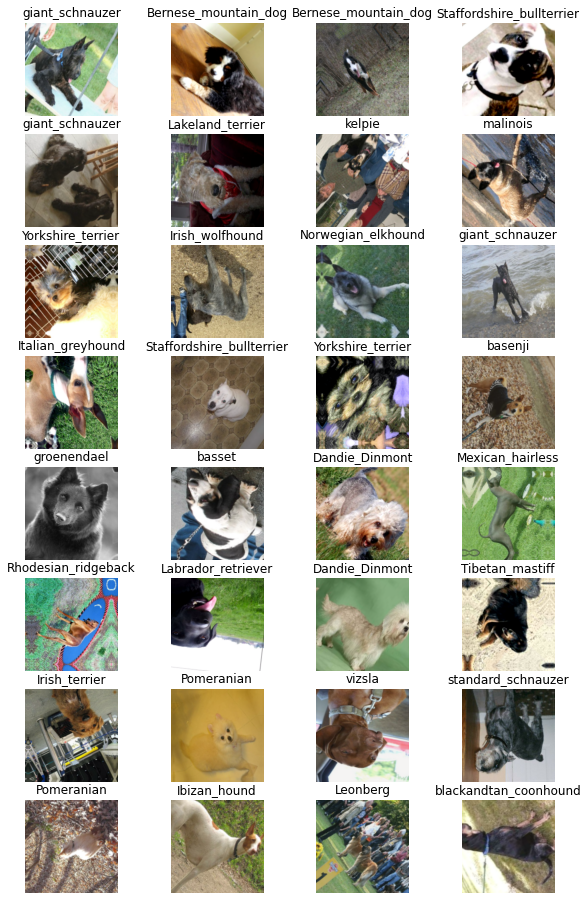

In [49]:
show_32_images(train_images, train_labels)

### Augmented Data Fitting

In [51]:
loaded_model = load_model("Models/2022_06_29-08_541656492878-full-augment0-image-set-mobilenetv2-Adam.h5")

Loading saved model from: Models/2022_06_29-08_541656492878-full-augment0-image-set-mobilenetv2-Adam.h5


In [50]:
# Create full model callbacks
full_augment2_model_tensorboard = create_tensorboard_callback()
full_augment2_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3) # Stops when accuracy does not improve for 3 epochs

In [52]:
# Fit the model to full data
loaded_model.fit(x=train_augment2_batch,
                epochs=100,
                validation_data=val_augment2_batch,
                validation_freq=1,
                callbacks=[full_augment2_model_tensorboard, full_augment2_model_early_stopping]
                )

Epoch 1/100
515/515 [==============================] - 364s 686ms/step - loss: 1.5299 - accuracy: 0.6186 - val_loss: 1.5155 - val_accuracy: 0.6215
Epoch 2/100
515/515 [==============================] - 302s 586ms/step - loss: 1.4658 - accuracy: 0.6308 - val_loss: 1.5687 - val_accuracy: 0.6101
Epoch 3/100
515/515 [==============================] - 305s 592ms/step - loss: 1.4286 - accuracy: 0.6337 - val_loss: 1.6938 - val_accuracy: 0.5977
Epoch 4/100
515/515 [==============================] - 300s 583ms/step - loss: 1.3868 - accuracy: 0.6418 - val_loss: 1.6670 - val_accuracy: 0.6003


In [53]:
saved_path = save_model(loaded_model, suffix="full-augment2-image-set-mobilenetv2-Adam")

Saving model to: Models/2022:06:30-06:141656569676-full-augment2-image-set-mobilenetv2-Adam.h5...


In [54]:
loaded_augment2 = load_model(saved_path)

Loading saved model from: Models/2022:06:30-06:141656569676-full-augment2-image-set-mobilenetv2-Adam.h5


Creating test data batches... BATCH SIZE=32


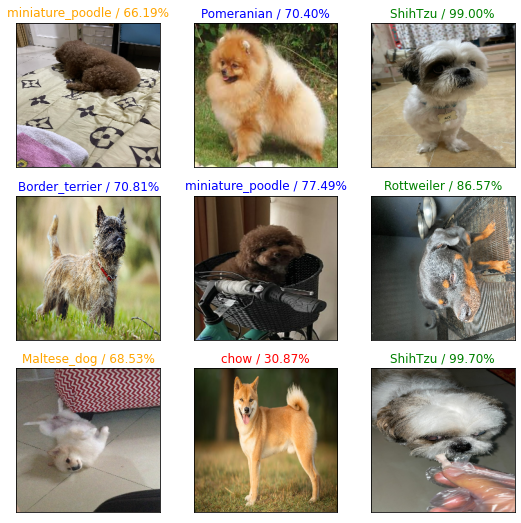

In [61]:
dog_breed_predict(custom_images, loaded_augment2)

In [56]:
prev_model = load_model("/content/Models/2022_06_29-08_541656492878-full-augment0-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/Models/2022_06_29-08_541656492878-full-augment0-image-set-mobilenetv2-Adam.h5


In [57]:
evaluate_model(prev_model, loaded_augment2, val_batch, val_augment2_batch)

NORMAL BATCH EVALUATION
Previous Model:
129/129 [==============================] - 15s 109ms/step - loss: 0.3690 - accuracy: 0.8800
New Model:
129/129 [==============================] - 14s 100ms/step - loss: 0.4917 - accuracy: 0.8508

AUGMENTED BATCH EVALUATION
Previous Model:
129/129 [==============================] - 58s 450ms/step - loss: 1.4103 - accuracy: 0.6399
New Model:
129/129 [==============================] - 68s 529ms/step - loss: 1.6850 - accuracy: 0.5957


### Evaluation after 3rd iteration of augmented data fitting
As seen above, the model's accuracy on normal batch is yet again decreasing, but this time it shows worse accuracy on the augmented batch.
For the reason stated, we will be continuing with the previous model

## 3rd Iteration of Augmented Data Training
Augment seed #3

In [66]:
def augment_training(prev_model_path, seed, x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val, custom_images=custom_images, val_batch=val_batch):
  """
  Function for the entire Iteration of Augmented data training
  """
  # Augmentation
  train_augment_batch = create_data_batches(x_train, y_train, augment=True, seed=seed)
  val_augment_batch = create_data_batches(x_val, y_val, valid_data=True, augment=True, seed=seed)

  # Training prep
  model = load_model(prev_model_path)
  full_augment_model_tensorboard = create_tensorboard_callback()
  full_augment_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3) # Stops when accuracy does not improve for 3 epochs
  
  # Fit the model to full data
  loaded_model.fit(x=train_augment_batch,
                epochs=100,
                validation_data=val_augment_batch,
                validation_freq=1,
                callbacks=[full_augment_model_tensorboard, full_augment_model_early_stopping]
                )
  saved_path = save_model(loaded_model, suffix=f"full-augment{seed}-image-set-mobilenetv2-Adam")
  
  # Evaluation
  prev_model = load_model(prev_model_path)
  dog_breed_predict(custom_images, loaded_model)
  evaluate_model(prev_model, loaded_model, val_batch, val_augment_batch)

Creating training data batches... BATCH SIZE=32
Augmenting seed = 3
Creating validation data batches... BATCH SIZE=32
Augmenting seed = 3


Augmented train batch sample


Loading saved model from: Models/2022_06_29-08_541656492878-full-augment0-image-set-mobilenetv2-Adam.h5
Epoch 1/100
515/515 [==============================] - 314s 608ms/step - loss: 1.3497 - accuracy: 0.6447 - val_loss: 1.7594 - val_accuracy: 0.5845
Epoch 2/100
515/515 [==============================] - 336s 653ms/step - loss: 1.3450 - accuracy: 0.6463 - val_loss: 1.7501 - val_accuracy: 0.5892
Epoch 3/100
515/515 [==============================] - 299s 581ms/step - loss: 1.3129 - accuracy: 0.6529 - val_loss: 1.8558 - val_accuracy: 0.5741
Epoch 4/100
515/515 [==============================] - 322s 626ms/step - loss: 1.3394 - accuracy: 0.6476 - val_loss: 1.8991 - val_accuracy: 0.5785
Epoch 5/100
515/515 [==============================] - 338s 656ms/step - loss: 1.3232 - accuracy: 0.6539 - val_loss: 1.9551 - val_accuracy: 0.5610
Saving model to: Models/2022:06:30-07:121656573132-full-augment3-image-set-mobilenetv2-Adam.h5...
Loading saved model from: Models/2022_06_29-08_541656492878-ful

NORMAL BATCH EVALUATION
Previous Model:
129/129 [==============================] - 18s 136ms/step - loss: 0.3690 - accuracy: 0.8800
New Model:
129/129 [==============================] - 18s 142ms/step - loss: 0.5856 - accuracy: 0.8224

AUGMENTED BATCH EVALUATION
Previous Model:
129/129 [==============================] - 78s 600ms/step - loss: 1.4012 - accuracy: 0.6416
New Model:
129/129 [==============================] - 72s 556ms/step - loss: 1.8993 - accuracy: 0.5685


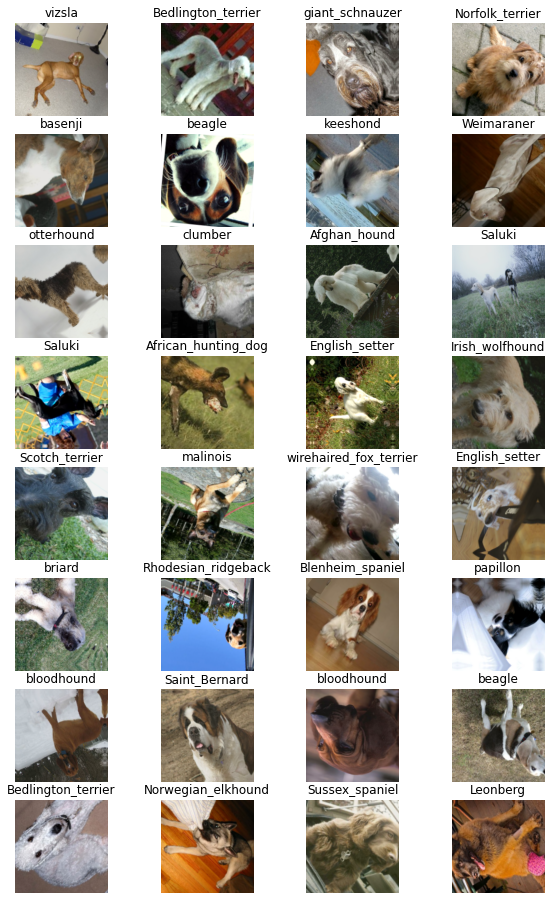

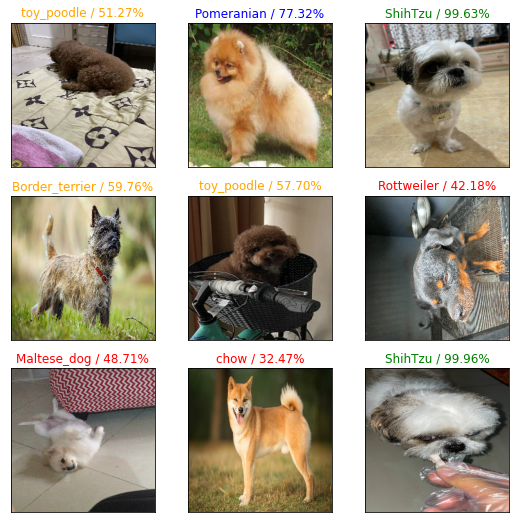

In [67]:
augment_training("Models/2022_06_29-08_541656492878-full-augment0-image-set-mobilenetv2-Adam.h5", 3)

Creating training data batches... BATCH SIZE=32
Augmenting seed = 4
Creating validation data batches... BATCH SIZE=32
Augmenting seed = 4


Augmented train batch sample


Loading saved model from: Models/2022:06:30-07:121656573132-full-augment3-image-set-mobilenetv2-Adam.h5
Epoch 1/100
515/515 [==============================] - 274s 531ms/step - loss: 1.3136 - accuracy: 0.6551 - val_loss: 1.9265 - val_accuracy: 0.5736
Epoch 2/100
515/515 [==============================] - 299s 581ms/step - loss: 1.2949 - accuracy: 0.6534 - val_loss: 1.9439 - val_accuracy: 0.5639
Epoch 3/100
515/515 [==============================] - 271s 527ms/step - loss: 1.2992 - accuracy: 0.6563 - val_loss: 1.9578 - val_accuracy: 0.5719
Epoch 4/100
515/515 [==============================] - 301s 584ms/step - loss: 1.2832 - accuracy: 0.6593 - val_loss: 2.0118 - val_accuracy: 0.5586
Saving model to: Models/2022:06:30-07:451656575156-full-augment4-image-set-mobilenetv2-Adam.h5...
Loading saved model from: Models/2022:06:30-07:121656573132-full-augment3-image-set-mobilenetv2-Adam.h5
Creating test data batches... BATCH SIZE=32
NORMAL BATCH EVALUATION
Previous Model:
129/129 [=============

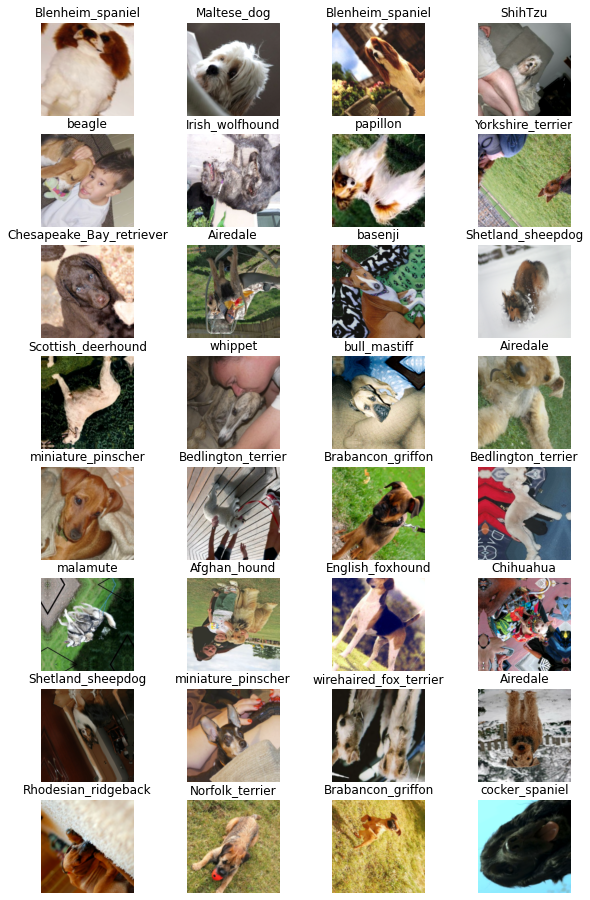

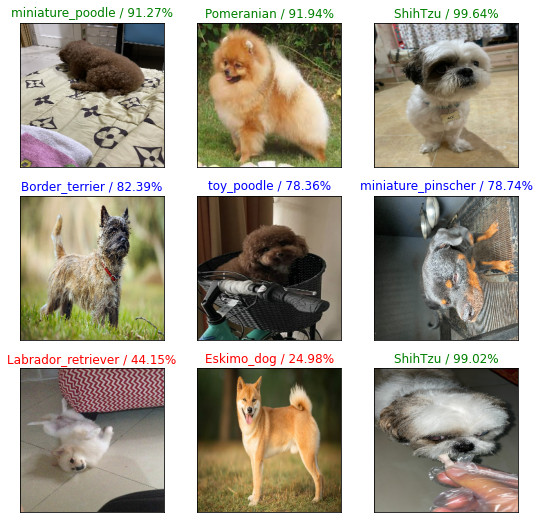

In [68]:
augment_training("Models/2022:06:30-07:121656573132-full-augment3-image-set-mobilenetv2-Adam.h5", 4)

In [71]:
!zip -r Logs.zip Logs

  adding: Logs/ (stored 0%)
  adding: Logs/20220630-064306/ (stored 0%)
  adding: Logs/20220630-064306/validation/ (stored 0%)
  adding: Logs/20220630-064306/validation/events.out.tfevents.1656571639.b6144a53777b.71.6.v2 (deflated 67%)
  adding: Logs/20220630-064306/train/ (stored 0%)
  adding: Logs/20220630-064306/train/events.out.tfevents.1656571386.b6144a53777b.71.5.v2 (deflated 92%)
  adding: Logs/20220630-04:30:48/ (stored 0%)
  adding: Logs/20220630-04:30:48/validation/ (stored 0%)
  adding: Logs/20220630-04:30:48/validation/events.out.tfevents.1656563824.b6144a53777b.71.2.v2 (deflated 65%)
  adding: Logs/20220630-04:30:48/train/ (stored 0%)
  adding: Logs/20220630-04:30:48/train/events.out.tfevents.1656563452.b6144a53777b.71.0.v2 (deflated 92%)
  adding: Logs/20220630-04:30:48/train/events.out.tfevents.1656563584.b6144a53777b.71.1.v2 (deflated 92%)
  adding: Logs/20220630-05:29:26/ (stored 0%)
  adding: Logs/20220630-05:29:26/validation/ (stored 0%)
  adding: Logs/20220630-05:29

Creating training data batches... BATCH SIZE=32
Augmenting seed = 5
Creating validation data batches... BATCH SIZE=32
Augmenting seed = 5


Augmented train batch sample


Loading saved model from: /content/Models/2022:06:30-07:451656575156-full-augment4-image-set-mobilenetv2-Adam.h5
Epoch 1/100
515/515 [==============================] - 303s 587ms/step - loss: 1.2798 - accuracy: 0.6604 - val_loss: 2.0245 - val_accuracy: 0.5600
Epoch 2/100
515/515 [==============================] - 301s 584ms/step - loss: 1.2654 - accuracy: 0.6614 - val_loss: 2.0233 - val_accuracy: 0.5639
Epoch 3/100
515/515 [==============================] - 300s 583ms/step - loss: 1.2671 - accuracy: 0.6599 - val_loss: 2.0957 - val_accuracy: 0.5464
Epoch 4/100
515/515 [==============================] - 301s 584ms/step - loss: 1.2525 - accuracy: 0.6633 - val_loss: 2.0211 - val_accuracy: 0.5607
Epoch 5/100
515/515 [==============================] - 271s 526ms/step - loss: 1.2569 - accuracy: 0.6676 - val_loss: 2.1160 - val_accuracy: 0.5552
Saving model to: Models/2022:06:30-08:221656577369-full-augment5-image-set-mobilenetv2-Adam.h5...
Loading saved model from: /content/Models/2022:06:30-0

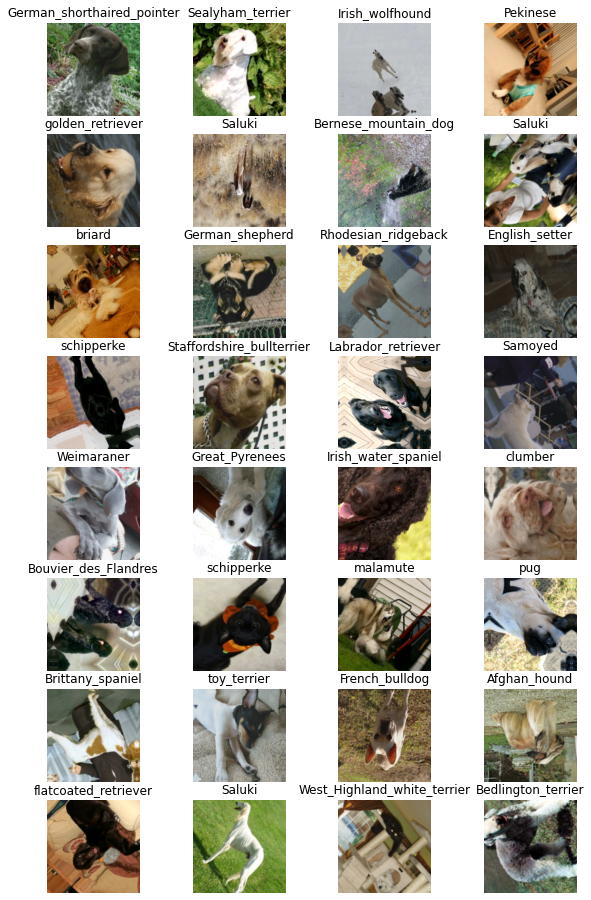

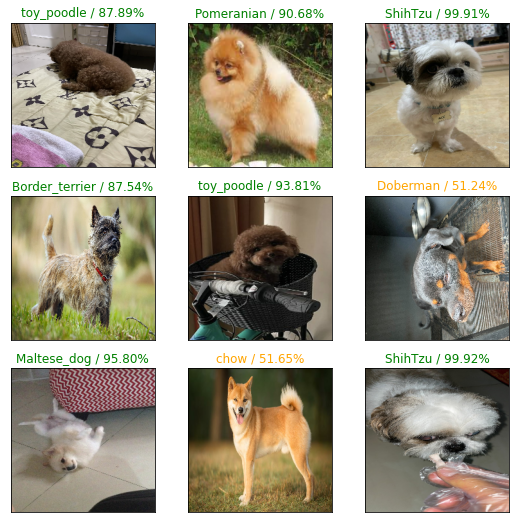

In [72]:
augment_training("/content/Models/2022:06:30-07:451656575156-full-augment4-image-set-mobilenetv2-Adam.h5", 5)

Creating training data batches... BATCH SIZE=32
Augmenting seed = 6
Creating validation data batches... BATCH SIZE=32
Augmenting seed = 6


Augmented train batch sample


Loading saved model from: /content/Models/2022:06:30-08:221656577369-full-augment5-image-set-mobilenetv2-Adam.h5
Epoch 1/100
515/515 [==============================] - 271s 526ms/step - loss: 1.2365 - accuracy: 0.6712 - val_loss: 2.0317 - val_accuracy: 0.5605
Epoch 2/100
515/515 [==============================] - 271s 527ms/step - loss: 1.2273 - accuracy: 0.6685 - val_loss: 2.0749 - val_accuracy: 0.5544
Epoch 3/100
515/515 [==============================] - 271s 526ms/step - loss: 1.2335 - accuracy: 0.6701 - val_loss: 2.1795 - val_accuracy: 0.5503
Epoch 4/100
515/515 [==============================] - 299s 581ms/step - loss: 1.2278 - accuracy: 0.6698 - val_loss: 2.0815 - val_accuracy: 0.5549
Saving model to: Models/2022_06_30-08_48_1656578928-full-augment6-image-set-mobilenetv2-Adam.h5...
Loading saved model from: /content/Models/2022:06:30-08:221656577369-full-augment5-image-set-mobilenetv2-Adam.h5
Creating test data batches... BATCH SIZE=32
NORMAL BATCH EVALUATION
Previous Model:
129

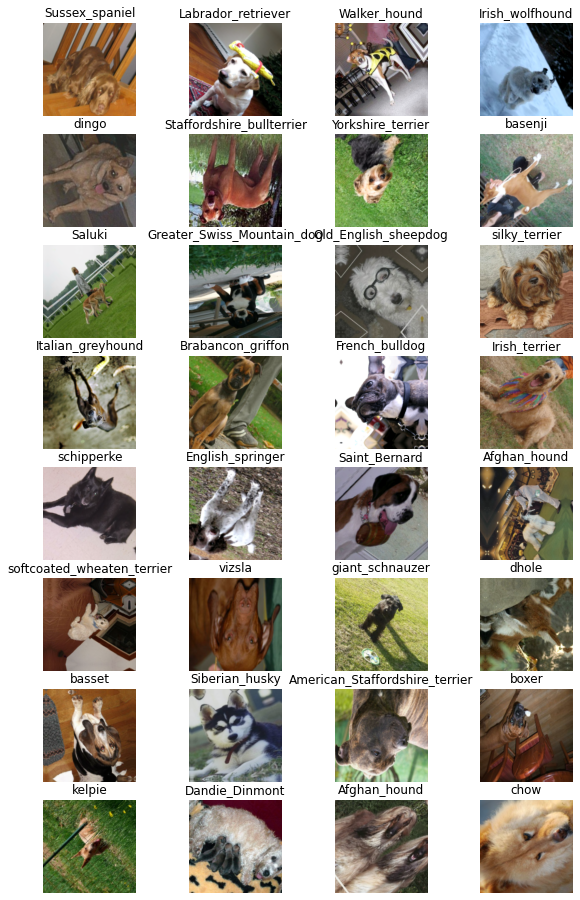

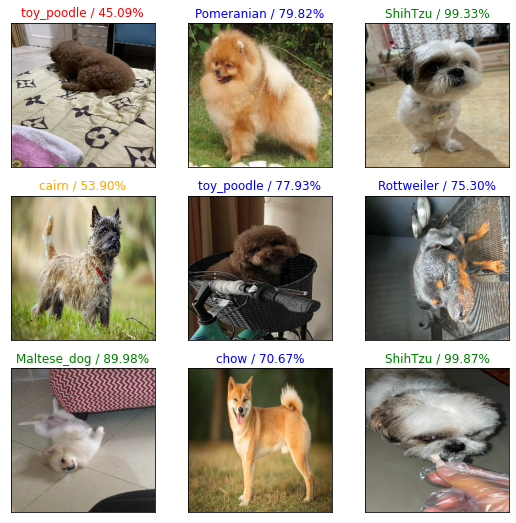

In [74]:
augment_training("/content/Models/2022:06:30-08:221656577369-full-augment5-image-set-mobilenetv2-Adam.h5", 6)

Creating training data batches... BATCH SIZE=32
Augmenting seed = 7
Creating validation data batches... BATCH SIZE=32
Augmenting seed = 7


Augmented train batch sample


Loading saved model from: /content/Models/2022_06_30-08_48_1656578928-full-augment6-image-set-mobilenetv2-Adam.h5
Epoch 1/100
515/515 [==============================] - 332s 644ms/step - loss: 1.2196 - accuracy: 0.6774 - val_loss: 2.0985 - val_accuracy: 0.5544
Epoch 2/100
515/515 [==============================] - 290s 564ms/step - loss: 1.2446 - accuracy: 0.6730 - val_loss: 2.1128 - val_accuracy: 0.5573
Epoch 3/100
515/515 [==============================] - 280s 545ms/step - loss: 1.2191 - accuracy: 0.6737 - val_loss: 2.1993 - val_accuracy: 0.5377
Epoch 4/100
515/515 [==============================] - 302s 586ms/step - loss: 1.1934 - accuracy: 0.6807 - val_loss: 2.1402 - val_accuracy: 0.5573
Epoch 5/100
515/515 [==============================] - 286s 555ms/step - loss: 1.2008 - accuracy: 0.6783 - val_loss: 2.2597 - val_accuracy: 0.5374
Saving model to: Models/2022_06_30-09_27_1656581275-full-augment7-image-set-mobilenetv2-Adam.h5...
Loading saved model from: /content/Models/2022_06_30

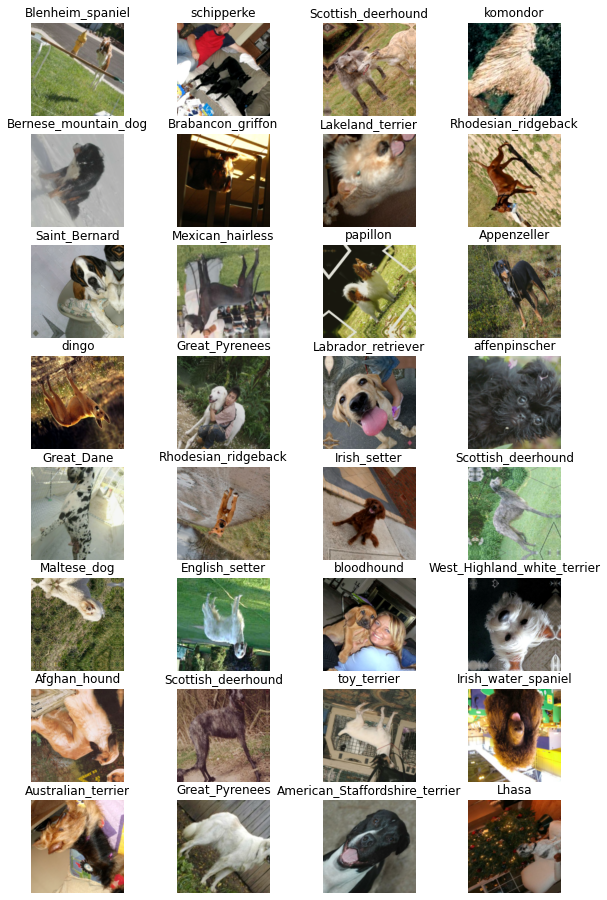

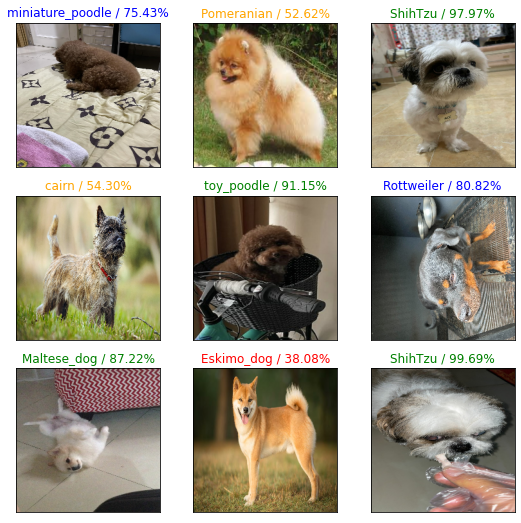

In [78]:
augment_training("/content/Models/2022_06_30-08_48_1656578928-full-augment6-image-set-mobilenetv2-Adam.h5", 7)

Creating training data batches... BATCH SIZE=32
Augmenting seed = 8
Creating validation data batches... BATCH SIZE=32
Augmenting seed = 8


Augmented train batch sample


Loading saved model from: Models/2022_06_30-09_27_1656581275-full-augment7-image-set-mobilenetv2-Adam.h5
Epoch 1/100
515/515 [==============================] - 273s 529ms/step - loss: 1.2209 - accuracy: 0.6790 - val_loss: 2.1624 - val_accuracy: 0.5517
Epoch 2/100
515/515 [==============================] - 301s 584ms/step - loss: 1.2006 - accuracy: 0.6734 - val_loss: 2.1758 - val_accuracy: 0.5500
Epoch 3/100
515/515 [==============================] - 301s 585ms/step - loss: 1.2185 - accuracy: 0.6780 - val_loss: 2.2372 - val_accuracy: 0.5396
Epoch 4/100
515/515 [==============================] - 306s 594ms/step - loss: 1.1877 - accuracy: 0.6846 - val_loss: 2.2017 - val_accuracy: 0.5481
Saving model to: Models/2022_06_30-09_54_1656582840-full-augment8-image-set-mobilenetv2-Adam.h5...
Loading saved model from: Models/2022_06_30-09_27_1656581275-full-augment7-image-set-mobilenetv2-Adam.h5
Creating test data batches... BATCH SIZE=32
NORMAL BATCH EVALUATION
Previous Model:
129/129 [==========

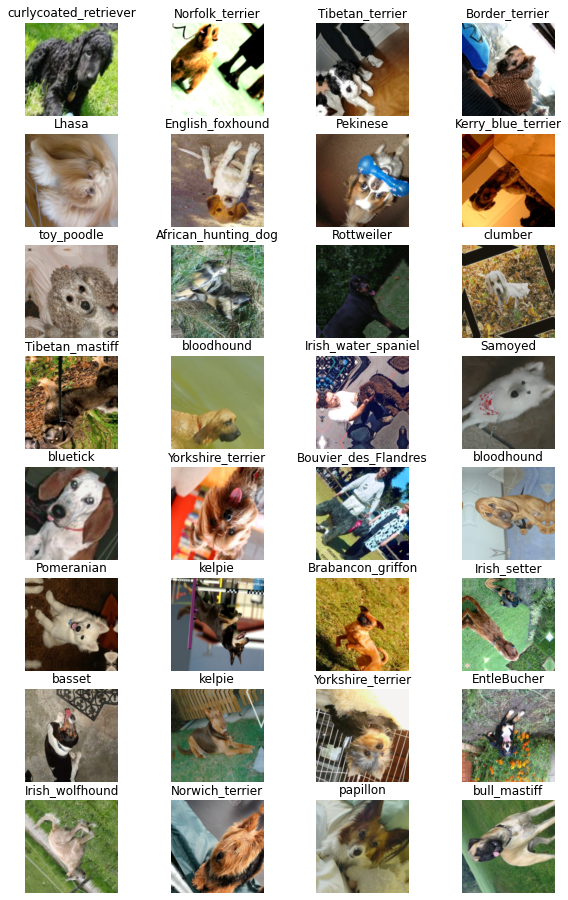

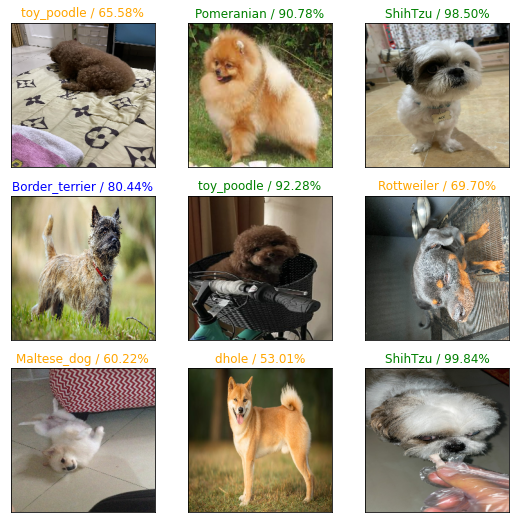

In [79]:
augment_training("Models/2022_06_30-09_27_1656581275-full-augment7-image-set-mobilenetv2-Adam.h5", 8)

In [80]:
!zip -r Models.zip Models

updating: Models/ (stored 0%)
updating: Models/2022_06_29-08_541656492878-full-augment0-image-set-mobilenetv2-Adam.h5 (deflated 8%)
updating: Models/2022_06_29-07_471656488859-full-image-set-mobilenetv2-Adam.h5 (deflated 8%)
updating: Models/2022:06:30-06:141656569676-full-augment2-image-set-mobilenetv2-Adam.h5 (deflated 8%)
updating: Models/2022:06:30-05:151656566150-full-augment1-image-set-mobilenetv2-Adam.h5 (deflated 8%)
updating: Models/2022:06:30-07:451656575156-full-augment4-image-set-mobilenetv2-Adam.h5 (deflated 8%)
updating: Models/2022:06:30-07:121656573132-full-augment3-image-set-mobilenetv2-Adam.h5 (deflated 8%)
updating: Models/2022_06_30-03_311656559904-full-augment1-image-set-mobilenetv2-Adam.h5 (deflated 8%)
  adding: Models/2022_06_30-08_48_1656578928-full-augment6-image-set-mobilenetv2-Adam.h5 (deflated 8%)
  adding: Models/2022:06:30-08:221656577369-full-augment5-image-set-mobilenetv2-Adam.h5 (deflated 8%)
  adding: Models/2022_06_30-09_27_1656581275-full-augment7-i

In [81]:
!zip -r Logs.zip Logs

updating: Logs/ (stored 0%)
updating: Logs/20220630-064306/ (stored 0%)
updating: Logs/20220630-064306/validation/ (stored 0%)
updating: Logs/20220630-064306/validation/events.out.tfevents.1656571639.b6144a53777b.71.6.v2 (deflated 67%)
updating: Logs/20220630-064306/train/ (stored 0%)
updating: Logs/20220630-064306/train/events.out.tfevents.1656571386.b6144a53777b.71.5.v2 (deflated 92%)
updating: Logs/20220630-04:30:48/ (stored 0%)
updating: Logs/20220630-04:30:48/validation/ (stored 0%)
updating: Logs/20220630-04:30:48/validation/events.out.tfevents.1656563824.b6144a53777b.71.2.v2 (deflated 65%)
updating: Logs/20220630-04:30:48/train/ (stored 0%)
updating: Logs/20220630-04:30:48/train/events.out.tfevents.1656563452.b6144a53777b.71.0.v2 (deflated 92%)
updating: Logs/20220630-04:30:48/train/events.out.tfevents.1656563584.b6144a53777b.71.1.v2 (deflated 92%)
updating: Logs/20220630-05:29:26/ (stored 0%)
updating: Logs/20220630-05:29:26/validation/ (stored 0%)
updating: Logs/20220630-05:29

In [ ]:
augment_training("Models/2022_06_30-09_54_1656582840-full-augment8-image-set-mobilenetv2-Adam.h5", 9)

Creating training data batches... BATCH SIZE=32
Augmenting seed = 9
Creating validation data batches... BATCH SIZE=32
Augmenting seed = 9


Augmented train batch sample


Loading saved model from: Models/2022_06_30-09_54_1656582840-full-augment8-image-set-mobilenetv2-Adam.h5
Epoch 1/100
165/515 [========>.....................] - ETA: 2:29 - loss: 1.1472 - accuracy: 0.6924